In [40]:
output_path = "/ssd1/wy/workspace2/nextflow_workspace/f6c3f352-4403-4402-ad1a-029fe32eb756/e75035ea-aba0-4216-a4c9-59edb28cc009/18cb2564-1cf1-4746-b4f4-c1c8ec205cb9/output"
params_path = "/ssd1/wy/workspace2/nextflow_workspace/f6c3f352-4403-4402-ad1a-029fe32eb756/e75035ea-aba0-4216-a4c9-59edb28cc009/18cb2564-1cf1-4746-b4f4-c1c8ec205cb9/params.json"

In [41]:
library(tidyverse)
library(readxl)
library(ggrepel)
library(jsonlite)

In [42]:
data <- fromJSON(params_path)

In [49]:
deg_files <- data$deg |>
    select("sample_name","deg")
deg_files

,sample_name,deg
,<chr>,<chr>
1,NAc_MS_vs_SS,/data/TABLES/liyijun/data/NAc MS vs. SS.xlsx
2,PFC_MS_vs_SS,/data/TABLES/liyijun/data/PFC MS vs. SS.xlsx
3,PFC_MI_vs_MS,/data/TABLES/liyijun/data/PFC MI vs. MS.xlsx


In [54]:
read_volcano <- function(path){
    df <- read_excel(path)
    df_deg <- df |>
        mutate(log2FoldChange = G2_vs_G1_log2FoldChange,pvalue = G2_vs_G1_Pvalue ) |>
        select(Symbol,log2FoldChange,pvalue)
    return(df_deg)
}


In [55]:
# read_volcano("/data/TABLES/liyijun/data/NAc MS vs. SS.xlsx")
# contrast=c("G2","G1")

Symbol,log2FoldChange,pvalue
<chr>,<dbl>,<dbl>
Zranb2,0.095504406,0.675823238
Lrriq3,-0.215045770,0.325204933
Adgrl2,0.081718073,0.886229373
Rpf1,-0.113727757,0.132344134
Uox,-1.067641418,0.005791655
Ctbs,0.073119611,0.597911399
Spata1,-0.154530824,0.441998127
Ptprh,0.116711836,0.941084869
Mir484,-0.019688794,0.957908409


In [65]:
volcano <- function(res,title){
    pval_cutoff = 0.05
    logfc_cutoff = 1
    deg_res_volcano <- as.data.frame(res) |>
        # rownames_to_column("symbol") |> 
        mutate(direction = factor(ifelse(pvalue < pval_cutoff & abs(log2FoldChange)>logfc_cutoff,
                                               ifelse(log2FoldChange>0,"Up","Down"),"NS"),
                                        levels = c("Up","Down","NS") 
                                    )) |>
        mutate(label =ifelse(pvalue < pval_cutoff & abs(log2FoldChange)> logfc_cutoff, Symbol,"") ) 

    ggplot(deg_res_volcano, aes(x= log2FoldChange, 
                y = -log10(pvalue), 
                colour=direction)) +
            geom_point(alpha=0.9, size=3.5)+
            scale_color_manual(values=c("Down" = "#3B4992FF", "NS"="#d2dae2","Up"="#EE0000FF"))+
            geom_vline(xintercept=c(-logfc_cutoff,logfc_cutoff),lty=4,col="black",lwd=0.8) +
            geom_hline(yintercept = -log10(pval_cutoff),lty=4,col="black",lwd=0.8)+
            ggtitle(paste0("volcano plot of ", title)) +
            labs(x="log2(fold change)", y="-log10 (p-value)")+
            theme_bw()+
            theme(plot.title = element_text(hjust = 0.5), 
                  axis.text = element_text(color = 'black',size = 10, family = 'sans', face = 'plain'),
                  axis.title = element_text(color = 'black',size = 15, family = 'sans', face = 'plain'),
                  legend.position="right", 
                  legend.title = element_blank()
            )+ geom_text_repel(data=deg_res_volcano,aes(label = label), 
                            colour = "black", size = 4)
}


In [67]:
apply(deg_files,1, function(x){
    message(x[1],x[2])
    df_deg = read_volcano(x[2])
    volcano(df_deg,title=str_replace_all(x[1],"_"," "))
    ggsave(file=paste0(output_path,"/",x[1],".pdf"))
})

NAc_MS_vs_SS/data/TABLES/liyijun/data/NAc MS vs. SS.xlsx

Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 251 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
PFC_MS_vs_SS/data/TABLES/liyijun/data/PFC MS vs. SS.xlsx

Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 340 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
PFC_MI_vs_MS/data/TABLES/liyijun/data/PFC MI vs. MS.xlsx

Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 290 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


1 
"/ssd1/wy/workspace2/nextflow_workspace/f6c3f352-4403-4402-ad1a-029fe32eb756/e75035ea-aba0-4216-a4c9-59edb28cc009/18cb2564-1cf1-4746-b4f4-c1c8ec205cb9/output/NAc_MS_vs_SS.pdf" 
                                                                                                                                                                              2 
"/ssd1/wy/workspace2/nextflow_workspace/f6c3f352-4403-4402-ad1a-029fe32eb756/e75035ea-aba0-4216-a4c9-59edb28cc009/18cb2564-1cf1-4746-b4f4-c1c8ec205cb9/output/PFC_MS_vs_SS.pdf" 
                                                                                                                                                                              3 
"/ssd1/wy/workspace2/nextflow_workspace/f6c3f352-4403-4402-ad1a-029fe32eb756/e75035ea-aba0-4216-a4c9-59edb28cc009/18cb2564-1cf1-4746-b4f4-c1c8ec205cb9/output/PFC_MI_vs_MS.pdf"

Warning message:
“ggrepel: 245 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 248 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


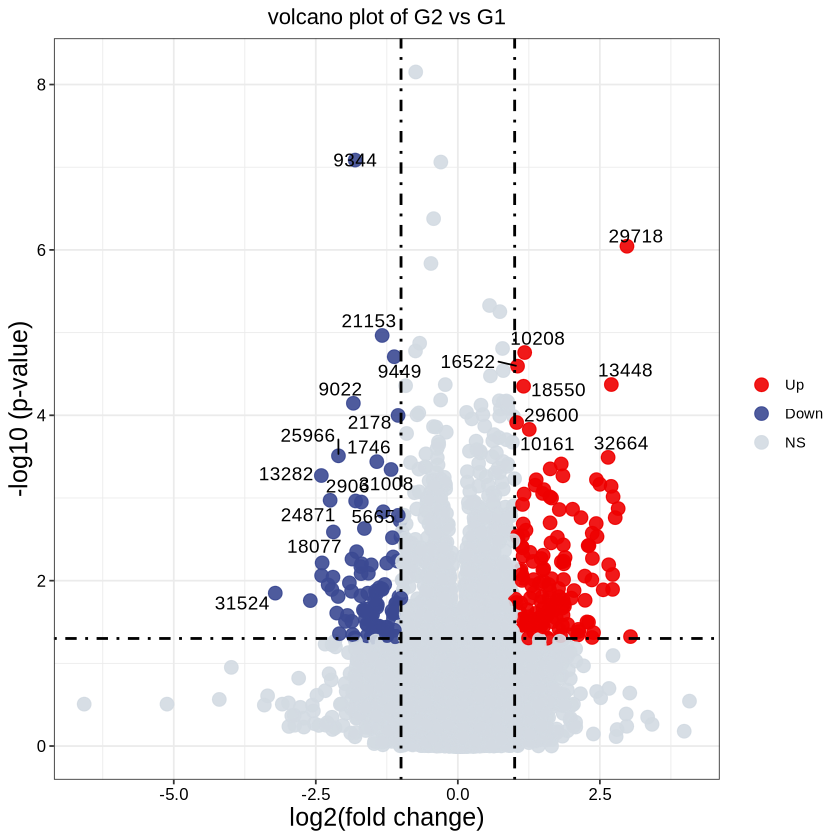

In [25]:
volcano(df_deg)
ggsave(file=paste0(output_path,"/",paste0(contrast,collapse = "-vs-"),".png"))

In [59]:
?str_replace_all

str_replace {stringr},R Documentation
string,"Input vector. Either a character vector, or something coercible to one."
pattern,"Pattern to look for. The default interpretation is a regular expression, as described in stringi::about_search_regex. Control options with regex(). To perform multiple replacements in each element of string, pass supply a named vector (c(pattern1 = replacement1)). Match a fixed string (i.e. by comparing only bytes), using fixed(). This is fast, but approximate. Generally, for matching human text, you'll want coll() which respects character matching rules for the specified locale."
replacement,"The replacement value, usually a single string, but it can be the a vector the same length as string or pattern. References of the form ⁠\1⁠, ⁠\2⁠, etc will be replaced with the contents of the respective matched group (created by ⁠()⁠). Alternatively, supply a function, which will be called once for each match (from right to left) and its return value will be used to replace the match."
